In [1]:
import networkx as nx
import pandas as pd

df = pd.read_csv("finale_data_after_processing2.csv", encoding='latin1')

In [2]:
df

,Number,Titre,Description,section,Figures,Definition,kw_bert,synonyms,Subject,Relation,Object,Generated Definition
0,11.2,Identify Risks,\nthe process of identifying individual projec...,NaN,NaN,process identify individual project risk well ...,"['project risk documenting', 'project risk sou...","[""['project risk list', 'project risk base', '...",process,identify,individual project risk source,The concept of process identify individual pro...
1,11.3,Perform Qualitative Risk Analysis,\nthe process of prioritizing individual proje...,NaN,NaN,process prioritize individual project risk ana...,"['project risk analysis', 'project risk', 'ind...","[""['project risk exposure', 'project risk', 'i...",process,prioritize,individual project risk analysis action assess...,The concept of process prioritize individual p...
2,11.4,Perform Quantitative Risk Analysis,\nthe process ofnumerically analyzing the comb...,NaN,NaN,process ofnumerically analyze combine effect i...,"['project risk', 'uncertainty overall project'...","[""['project risk exposure', 'project risk', 'i...",process analyze,combine,effect,The concept of process analyze combine effect ...
3,11.5,Plan Risk Responses,"\nthe process of developing options, selecting...",NaN,NaN,process develop option select strategy agree a...,"['project risk exposure', 'project risk', 'ind...","[""['project risk plan', 'project document cons...",process,develop,option select strategy,The concept of process develop option select s...
4,11.7,Monitor Risks,\nthe process of monitoring the implementation...,NaN,figure 11-1,process monitor implementation agree - upon ri...,"['project risk control', 'project process', 'p...","[""['project risk process', 'project risk proje...",process monitor implementation agree risk resp...,track,identify risk,The concept of process monitor implementation ...
...,...,...,...,...,...,...,...,...,...,...,...,...
1504,0.5.1.4,Scenario Analysis,scenario analysis for risk response planning ...,NaN,NaN,scenario analysis risk response planning invol...,"['risk project management', 'project risk mana...","['risk project management', 'project risk mana...",overall project risk,derive,individual risk,The concept of overall project risk derive ind...
1505,0.5.1.4,Scenario Analysis,scenario analysis for risk response planning ...,NaN,NaN,scenario analysis risk response planning invol...,"['risk project management', 'project risk mana...","['risk project management', 'project risk mana...",multiple perspective result document objectivity,result,effective present opportunity explicit identif...,The concept of multiple perspective result doc...
1506,0.5.1.4,Scenario Analysis,scenario analysis for risk response planning ...,NaN,NaN,scenario analysis risk response planning invol...,"['risk project management', 'project risk mana...","['risk project management', 'project risk mana...",objective risk,link,tool technique,The concept of objective risk link tool techni...
1507,0.5.1.4,Scenario Analysis,scenario analysis for risk response planning ...,NaN,NaN,scenario analysis risk response planning invol...,"['risk project management', 'project risk mana...","['risk project management', 'project risk mana...",perspective tool technique r risk impact calcu...,see,risk breakdown structure risk management pract...,The concept of perspective tool technique r ri...


In [3]:
import networkx as nx
import pandas as pd
import matplotlib.pyplot as plt

# Define a function to add nodes with attributes to the knowledge graph
def add_node_with_attributes(graph, concept, keyword, synonym,definition):
    graph.add_node(concept, Keywords=keyword, Synonyms=synonym, Definition=definition)

# Define a function to add edges (relationships) to the knowledge graph
def add_edges(graph, relationships, df):
    for i, (subject, obj) in enumerate(relationships):
        relation_type = df.loc[i, 'Relation']
        if pd.notna(obj):
            object_concepts = obj.split(', ')
            for object_concept in object_concepts:
                graph.add_edge(subject, object_concept, relationship=relation_type)

# Create an empty directed graph
knowledge_graph = nx.DiGraph()

# Extract information from the DataFrame
concepts, relationships, keywords, synonyms, definitions = (
    df['Subject'].tolist(),
    df[['Object', 'Relation']].values.tolist(),
    df['kw_bert'].tolist(),
    df['synonyms'].tolist(),
    df['Generated Definition'].tolist()
)

# Populate the knowledge graph
for concept, keyword, synonym,definition in zip(concepts, keywords, synonyms,definitions):
    add_node_with_attributes(knowledge_graph, concept, keyword, synonym,definition)

add_edges(knowledge_graph, relationships, df)


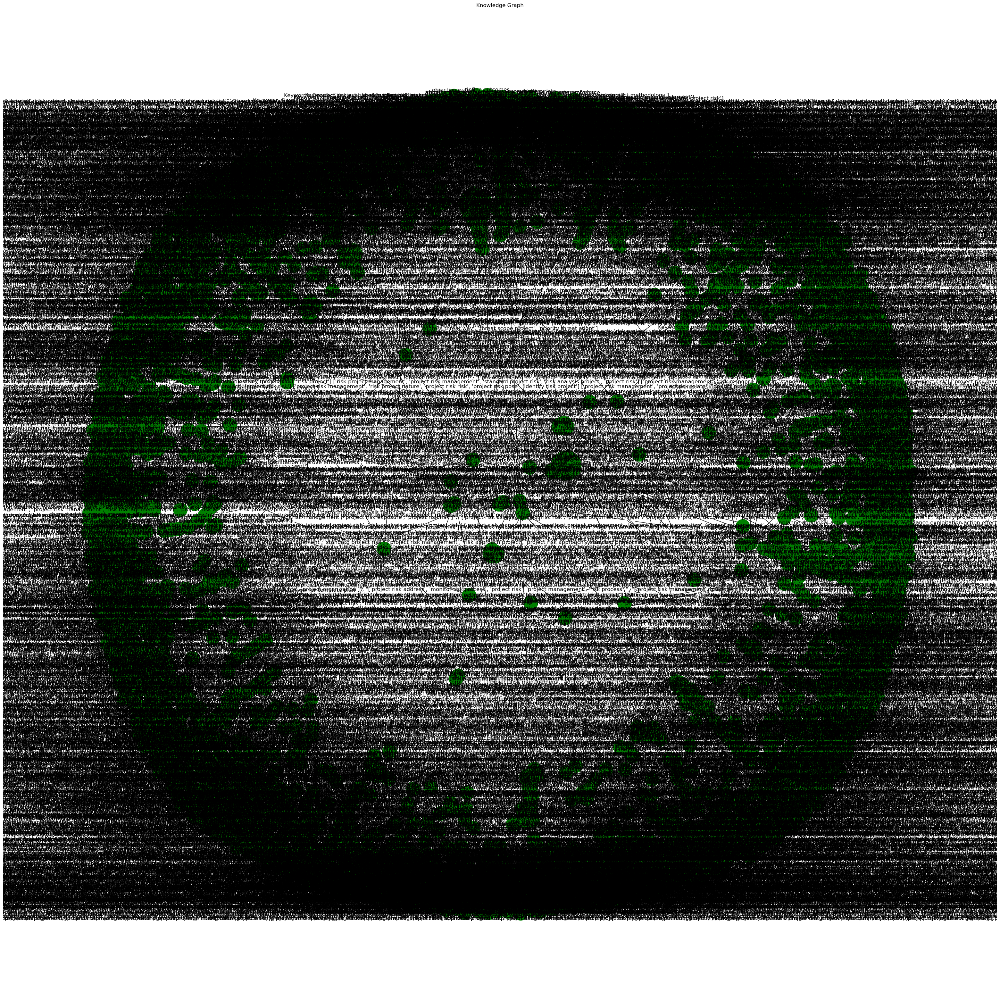

In [4]:
# Visualization
pos = nx.spring_layout(knowledge_graph)
labels = {node: f"{node}\nKeywords: {knowledge_graph.nodes[node]['Keywords']}\nSynonyms: {knowledge_graph.nodes[node]['Synonyms']}" for node in concepts}
edge_labels = {(edge[0], edge[1]): data['relationship'] for edge, data in knowledge_graph.edges.items()}

# Use a different variable name for the figure
fig, axes = plt.subplots(figsize=(40, 40), clear=True)
nx.draw(knowledge_graph, pos, with_labels=True, labels=labels, node_size=1000, node_color='green', font_size=12, ax=axes)
nx.draw_networkx_edge_labels(knowledge_graph, pos, edge_labels=edge_labels, font_size=10)
plt.title("Knowledge Graph")
plt.axis('off')
plt.show()


In [5]:
import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
from sklearn.model_selection import train_test_split
import dgl
import networkx as nx
import pandas as pd
import matplotlib.pyplot as plt
# Convert the NetworkX graph to a DGL graph and add self-loops
G_dgl = dgl.add_self_loop(dgl.from_networkx(knowledge_graph))

## GNN Model:

In [6]:
# Define a Graph Neural Network (GNN) model
class GNN(nn.Module):
    def __init__(self, in_feats, hidden_feats, out_feats, num_layers):
        super(GNN, self).__init__()
        self.layers = nn.ModuleList([
            dgl.nn.GraphConv(in_feats if i == 0 else hidden_feats, hidden_feats, activation=F.relu)
            for i in range(num_layers - 1)
        ])
        self.layers.append(dgl.nn.GraphConv(hidden_feats, out_feats))

    def forward(self, g, features):
        h = features
        for layer in self.layers:
            h = layer(g, h)
        return h

## Splitting 80%:

In [7]:
# Generate random node features and labels
features = torch.rand(G_dgl.number_of_nodes(), 1509)
labels = torch.randint(0, 2, (G_dgl.number_of_nodes(),))
# Split the data into training and testing sets
train_indices, test_indices = train_test_split(range(G_dgl.number_of_nodes()), test_size=0.2, stratify=labels)
train_mask = torch.zeros(G_dgl.number_of_nodes(), dtype=torch.bool)
test_mask = torch.zeros(G_dgl.number_of_nodes(), dtype=torch.bool)
train_mask[train_indices] = True
test_mask[test_indices] = True

## Finding best param:

In [20]:
import itertools
# Hyperparameter tuning (Grid Search)
hyperparams_grid = {
    'hidden_feats': [32, 64, 128],
    'num_layers': [2, 3, 4],
    'learning_rate': [0.001, 0.01, 0.1]
}

best_params = None
best_loss = float('inf')

for params in itertools.product(*hyperparams_grid.values()):
    hidden_feats, num_layers, learning_rate = params
    model = GNN(in_feats=1509, hidden_feats=hidden_feats, out_feats=2, num_layers=num_layers)
    criterion = nn.CrossEntropyLoss()
    optimizer = optim.Adam(model.parameters(), lr=learning_rate)

    for epoch in range(100):
        model.train()
        optimizer.zero_grad()
        logits = model(G_dgl, features.float())
        loss = criterion(logits[train_mask], labels[train_mask])
        loss.backward()
        optimizer.step()

    with torch.no_grad():
        model.eval()
        logits_val = model(G_dgl, features.float())
        loss_val = criterion(logits_val[test_mask], labels[test_mask])

    if loss_val < best_loss:
        best_loss = loss_val
        best_params = params

print(f'Best Hyperparameters: {best_params}, Best Validation Loss: {best_loss.item()}')


Best Hyperparameters: (128, 3, 0.01), Best Validation Loss: 0.6916348934173584


###### 1509  columns:(pmbook +PMI)

In [12]:
in_dim = 1509  # Dimension of entity embeddings
hidden_dim = 128  # Dimension of hidden layers
out_dim = 2  # Dimension of the final output
num_layer = 3  # Number of GCN layers
model = GNN(in_feats=in_dim, hidden_feats=hidden_dim, out_feats=out_dim, num_layers=num_layer)

## Optimizing:

In [13]:
# Define your loss function and optimizer
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=0.01)

## Training:

In [14]:
# Training loop
num_epochs = 800
for epoch in range(num_epochs):
    model.train()
    optimizer.zero_grad()
    logits = model(G_dgl, features.float())
    loss = criterion(logits[train_mask], labels[train_mask])
    loss.backward()

    optimizer.step()

    # Print additional metrics
    with torch.no_grad():
        model.eval()
        train_pred = torch.argmax(logits[train_mask], dim=1)
        acc = accuracy_score(labels[train_mask].numpy(), train_pred.numpy())
        precision = precision_score(labels[train_mask].numpy(), train_pred.numpy())
        recall = recall_score(labels[train_mask].numpy(), train_pred.numpy())
        f1 = f1_score(labels[train_mask].numpy(), train_pred.numpy())

    print(f'Epoch {epoch + 1}/{num_epochs}, Loss: {loss.item()}, Accuracy: {acc}, Precision: {precision}, Recall: {recall}, F1: {f1}')


Epoch 1/800, Loss: 0.7271201610565186, Accuracy: 0.5002084201750729, Precision: 0.53125, Recall: 0.02826267664172901, F1: 0.05367008681925809
Epoch 2/800, Loss: 21.381620407104492, Accuracy: 0.5014589412255106, Precision: 0.5014589412255106, Recall: 1.0, F1: 0.6679622431982232
Epoch 3/800, Loss: 2.94333553314209, Accuracy: 0.5014589412255106, Precision: 0.5014589412255106, Recall: 1.0, F1: 0.6679622431982232
Epoch 4/800, Loss: 0.6928082704544067, Accuracy: 0.4964568570237599, Precision: 0.4982231698649609, Recall: 0.5827098919368247, F1: 0.5371647509578544
Epoch 5/800, Loss: 1.2331864833831787, Accuracy: 0.49854105877448934, Precision: 0.0, Recall: 0.0, F1: 0.0
Epoch 6/800, Loss: 0.7444463968276978, Accuracy: 0.49854105877448934, Precision: 0.0, Recall: 0.0, F1: 0.0


C:\Users\hamma\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\hamma\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Epoch 7/800, Loss: 1.0385721921920776, Accuracy: 0.5014589412255106, Precision: 0.5014589412255106, Recall: 1.0, F1: 0.6679622431982232
Epoch 8/800, Loss: 0.8454813957214355, Accuracy: 0.5014589412255106, Precision: 0.5014589412255106, Recall: 1.0, F1: 0.6679622431982232
Epoch 9/800, Loss: 0.7506912350654602, Accuracy: 0.49854105877448934, Precision: 0.0, Recall: 0.0, F1: 0.0


C:\Users\hamma\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\hamma\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\hamma\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Epoch 10/800, Loss: 0.8867273926734924, Accuracy: 0.49854105877448934, Precision: 0.0, Recall: 0.0, F1: 0.0
Epoch 11/800, Loss: 0.7173469066619873, Accuracy: 0.49854105877448934, Precision: 0.0, Recall: 0.0, F1: 0.0
Epoch 12/800, Loss: 0.744026780128479, Accuracy: 0.5010421008753647, Precision: 0.5012510425354462, Recall: 0.999168744804655, F1: 0.6675923354623715
Epoch 13/800, Loss: 0.7931689023971558, Accuracy: 0.5014589412255106, Precision: 0.5014589412255106, Recall: 1.0, F1: 0.6679622431982232
Epoch 14/800, Loss: 0.7197256684303284, Accuracy: 0.5022926219258024, Precision: 0.5018789144050104, Recall: 0.999168744804655, F1: 0.6681489716509172
Epoch 15/800, Loss: 0.7042720317840576, Accuracy: 0.49854105877448934, Precision: 0.0, Recall: 0.0, F1: 0.0


C:\Users\hamma\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\hamma\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\hamma\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Epoch 16/800, Loss: 0.7513601183891296, Accuracy: 0.49854105877448934, Precision: 0.0, Recall: 0.0, F1: 0.0
Epoch 17/800, Loss: 0.7291993498802185, Accuracy: 0.49854105877448934, Precision: 0.0, Recall: 0.0, F1: 0.0
Epoch 18/800, Loss: 0.6918805241584778, Accuracy: 0.5273030429345561, Precision: 0.5393386545039909, Recall: 0.3931837073981712, F1: 0.4548076923076923
Epoch 19/800, Loss: 0.7191213369369507, Accuracy: 0.5022926219258024, Precision: 0.5018789144050104, Recall: 0.999168744804655, F1: 0.6681489716509172
Epoch 20/800, Loss: 0.7295334935188293, Accuracy: 0.5014589412255106, Precision: 0.5014601585314977, Recall: 0.999168744804655, F1: 0.6677777777777778
Epoch 21/800, Loss: 0.6989302635192871, Accuracy: 0.5043768236765319, Precision: 0.5029313232830821, Recall: 0.99833748960931, F1: 0.6688944583681427


C:\Users\hamma\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\hamma\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\hamma\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Epoch 22/800, Loss: 0.6947965621948242, Accuracy: 0.49854105877448934, Precision: 0.0, Recall: 0.0, F1: 0.0
Epoch 23/800, Loss: 0.7120625376701355, Accuracy: 0.49854105877448934, Precision: 0.0, Recall: 0.0, F1: 0.0
Epoch 24/800, Loss: 0.7079713344573975, Accuracy: 0.49854105877448934, Precision: 0.0, Recall: 0.0, F1: 0.0
Epoch 25/800, Loss: 0.6926380395889282, Accuracy: 0.49979157982492706, Precision: 1.0, Recall: 0.0024937655860349127, F1: 0.004975124378109453
Epoch 26/800, Loss: 0.6972211599349976, Accuracy: 0.5056273447269696, Precision: 0.503569928601428, Recall: 0.9966749792186201, F1: 0.6690848214285715
Epoch 27/800, Loss: 0.7065820693969727, Accuracy: 0.5043768236765319, Precision: 0.5029313232830821, Recall: 0.99833748960931, F1: 0.6688944583681427
Epoch 28/800, Loss: 0.6996877193450928, Accuracy: 0.5043768236765319, Precision: 0.5029313232830821, Recall: 0.99833748960931, F1: 0.6688944583681427
Epoch 29/800, Loss: 0.6913036108016968, Accuracy: 0.5177157148812005, Precision: 0

C:\Users\hamma\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\hamma\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\hamma\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Epoch 31/800, Loss: 0.699521541595459, Accuracy: 0.49854105877448934, Precision: 0.0, Recall: 0.0, F1: 0.0
Epoch 32/800, Loss: 0.6928292512893677, Accuracy: 0.49854105877448934, Precision: 0.0, Recall: 0.0, F1: 0.0
Epoch 33/800, Loss: 0.691267728805542, Accuracy: 0.519383076281784, Precision: 0.5136761487964989, Recall: 0.7805486284289277, F1: 0.6195974925767075
Epoch 34/800, Loss: 0.6961476802825928, Accuracy: 0.5060441850771155, Precision: 0.503784693019344, Recall: 0.9958437240232751, F1: 0.6690868472493717
Epoch 35/800, Loss: 0.6949544548988342, Accuracy: 0.5064610254272613, Precision: 0.5040101308569016, Recall: 0.9925187032418953, F1: 0.6685330347144458
Epoch 36/800, Loss: 0.6904535293579102, Accuracy: 0.5197999166319299, Precision: 0.5175983436853002, Recall: 0.6234413965087282, F1: 0.5656108597285068
Epoch 37/800, Loss: 0.692051887512207, Accuracy: 0.4989578991246353, Precision: 1.0, Recall: 0.0008312551953449709, F1: 0.0016611295681063125
Epoch 38/800, Loss: 0.6944069266319275

C:\Users\hamma\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Epoch 39/800, Loss: 0.691522479057312, Accuracy: 0.49937473947478117, Precision: 1.0, Recall: 0.0016625103906899418, F1: 0.0033195020746887966
Epoch 40/800, Loss: 0.6899546980857849, Accuracy: 0.5243851604835348, Precision: 0.5224963715529753, Recall: 0.5985037406483791, F1: 0.5579232855482372
Epoch 41/800, Loss: 0.6921676993370056, Accuracy: 0.5135473113797415, Precision: 0.5077519379844961, Recall: 0.9800498753117207, F1: 0.6689361702127661
Epoch 42/800, Loss: 0.692093014717102, Accuracy: 0.5122967903293039, Precision: 0.5071090047393365, Recall: 0.9783873649210307, F1: 0.6679909194097617
Epoch 43/800, Loss: 0.6897537708282471, Accuracy: 0.5181325552313464, Precision: 0.5161957270847691, Recall: 0.6226101413133832, F1: 0.5644310474755087
Epoch 44/800, Loss: 0.690013587474823, Accuracy: 0.5181325552313464, Precision: 0.821917808219178, Recall: 0.04987531172069826, F1: 0.09404388714733543


C:\Users\hamma\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Epoch 45/800, Loss: 0.6913125514984131, Accuracy: 0.49854105877448934, Precision: 0.0, Recall: 0.0, F1: 0.0
Epoch 46/800, Loss: 0.69001704454422, Accuracy: 0.5072947061275531, Precision: 0.8888888888888888, Recall: 0.0199501246882793, F1: 0.03902439024390244
Epoch 47/800, Loss: 0.688930869102478, Accuracy: 0.5468945393914131, Precision: 0.5464743589743589, Recall: 0.5669160432252701, F1: 0.5565075479396164
Epoch 48/800, Loss: 0.6898758411407471, Accuracy: 0.5318882867861608, Precision: 0.5204498977505112, Recall: 0.8462177888611804, F1: 0.6445077556188666
Epoch 49/800, Loss: 0.6897817850112915, Accuracy: 0.5339724885368904, Precision: 0.5211337642963699, Recall: 0.8711554447215295, F1: 0.6521468574984443
Epoch 50/800, Loss: 0.688491940498352, Accuracy: 0.5410587744893706, Precision: 0.537833827893175, Recall: 0.6026600166251039, F1: 0.5684045472363778
Epoch 51/800, Loss: 0.6886255741119385, Accuracy: 0.5598165902459358, Precision: 0.8266666666666667, Recall: 0.1546134663341646, F1: 0.2

C:\Users\hamma\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Epoch 131/800, Loss: 0.7922570109367371, Accuracy: 0.49854105877448934, Precision: 0.0, Recall: 0.0, F1: 0.0
Epoch 132/800, Loss: 0.6385623216629028, Accuracy: 0.5802417674030846, Precision: 0.5457943925233645, Recall: 0.970906068162926, F1: 0.6987735566856117
Epoch 133/800, Loss: 0.7374817728996277, Accuracy: 0.5014589412255106, Precision: 0.5014601585314977, Recall: 0.999168744804655, F1: 0.6677777777777778
Epoch 134/800, Loss: 0.627173125743866, Accuracy: 0.676948728636932, Precision: 0.9099616858237548, Recall: 0.3948462177888612, F1: 0.5507246376811593
Epoch 135/800, Loss: 0.7106403112411499, Accuracy: 0.5002084201750729, Precision: 1.0, Recall: 0.0033250207813798837, F1: 0.006628003314001657
Epoch 136/800, Loss: 0.6210170388221741, Accuracy: 0.7523968320133388, Precision: 0.7673397717295873, Recall: 0.7265170407315046, F1: 0.7463706233988046
Epoch 137/800, Loss: 0.6906033754348755, Accuracy: 0.5056273447269696, Precision: 0.5035609551738583, Recall: 0.999168744804655, F1: 0.66963

## Evaluation:

In [17]:
model.eval()
with torch.no_grad():
    logits = model(G_dgl, features.float())
    probs = torch.softmax(logits, dim=1)
    classes = torch.argmax(probs, dim=1)

    labels_bin = labels[test_mask].numpy()
    
    acc = accuracy_score(labels_bin, classes[test_mask])
    prec = precision_score(labels_bin, classes[test_mask])
    rec = recall_score(labels_bin, classes[test_mask])
    f1 = f1_score(labels_bin, classes[test_mask])


    print(f'Acc: {acc}')
    print(f'Prec: {prec}')
    print(f'Rec: {rec}')
    print(f'F1: {f1}')

Acc: 0.6394330971238016
Prec: 0.6017915309446255
Rec: 0.6375727348295926
F1: 0.6046291922531885


## After training, the model undergoes parameter updates, enabling the generation of embeddings.

In [53]:
def get_embeddings(graph, node_features):
    return model(graph, node_features.float()).detach().numpy()

##### For recommendation purposes, the following function calculates cosine similarity between a query and all nodes, selecting the top k nodes with the highest similarity.

In [67]:
from sklearn.metrics.pairwise import cosine_similarity

def recommend(query, layer=3):
    # Find the indices of the query node in the dataframe
    query_indices = df[df["Subject"].str.lower() == query.lower()].index.tolist()
    
    if not query_indices:
        print(f"{query} not found.")
        return
    
    # Get embeddings for the query node
    query_embeddings = get_embeddings(G_dgl, features)[query_indices]

    # Get embeddings for all nodes in the graph
    all_embeddings = get_embeddings(G_dgl, features)

    # Compute cosine similarity
    similarities = cosine_similarity(query_embeddings, all_embeddings)

    # Find the indices of the top layer recommendations
    top_recommendations = similarities.argsort(axis=1)[:, :layer-1][:, ::-1]

    print(f"Recommendations:")
    # Display recommendations for each query
    for i, indices in enumerate(top_recommendations):
        for idx in indices:
            if 0 <= idx < len(concepts):
                print(f"{concepts[idx]} ")
                print(f"=>in row: {idx} - |similarity: {similarities[i, idx]}")
                print(f"-------------------- Title -------------------- ")
                print(df["Titre"][idx])
                print(f"-------------------------------------------------")
                print()

# Example usage
recommend('process', 5)


Recommendations:
overall project risk integrate 
=>in row: 772 - |similarity: -0.981113076210022
-------------------- Title -------------------- 
Project Risk Management Processes
-------------------------------------------------

hassan henry hattenrath david haugh john hendricks 
=>in row: 1226 - |similarity: -0.9869757890701294
-------------------- Title -------------------- 
Documenting the Results of the Monitor and Control Risks Process
-------------------------------------------------

overall project risk integrate 
=>in row: 772 - |similarity: -0.9948229193687439
-------------------- Title -------------------- 
Project Risk Management Processes
-------------------------------------------------

hassan henry hattenrath david haugh john hendricks 
=>in row: 1226 - |similarity: -0.9976404905319214
-------------------- Title -------------------- 
Documenting the Results of the Monitor and Control Risks Process
-------------------------------------------------

overall project risk